In [79]:
import pandas as pd
import numpy as np
from sqlalchemy import create_engine
import matplotlib.pyplot as plt
import seaborn as sns
from meteostat import Daily, Point
from datetime import datetime
import missingno as msno
import plotly.express as px
from statsmodels.graphics.tsaplots import plot_acf
import calendar

### Cargamos los datos desde MySQL y preparamos los DataFrames

Hacemos los imports necesarios para este notebook

In [ ]:
host = ""
user = ""
password = ""
database = ""

engine = create_engine(f"mysql+pymysql://{user}:{password}@{host}:3306/{database}", pool_pre_ping=True)

# Cargar DataFrames desde MySQL
df_pedidos = pd.read_sql("SELECT * FROM dfg_pedidos", con=engine)
df_ventas = pd.read_sql("SELECT * FROM dfg_ventas", con=engine)
df_calendario = pd.read_sql("SELECT * FROM dfg_calendario", con=engine)

# Asegurar formato de fechas
df_ventas["FechaVenta"] = pd.to_datetime(df_ventas["FechaVenta"])


In [5]:
df_ventas

,FAMILIA,Tipo,FechaVenta,HoraVenta,Articulo,Cantidad,Precio,Importe
0,BOLLERIA,VENTA,2017-01-01,8,5820,3.00,4.091,12.2730
1,BOLLERIA,VENTA,2017-01-01,9,3880,12.00,2.182,26.1840
2,BOLLERIA,VENTA,2017-01-01,9,3894,6.00,3.000,18.0000
3,BOLLERIA,VENTA,2017-01-01,9,3960,21.00,1.773,37.2330
4,BOLLERIA,VENTA,2017-01-01,9,3974,15.00,3.273,49.0950
...,...,...,...,...,...,...,...,...
940420,PASTELERIA,VENTA,2023-05-18,20,5619,6.00,4.364,26.1840
940421,PASTELERIA,VENTA,2023-05-18,20,7689,6.00,4.909,29.4540
940422,PASTELERIA,VENTA,2023-05-18,20,5730,3.00,4.364,13.0920
940423,PASTELERIA,VENTA,2023-05-18,20,5936,0.57,65.318,37.2313


#### Como no he hecho lo de los festivos anteriormente en mi dataframe, lo voy a hacer ahora

In [6]:
# Asegurarse de que las fechas están en formato datetime
df_ventas["FechaVenta"] = pd.to_datetime(df_ventas["FechaVenta"])
df_calendario["Fecha"] = pd.to_datetime(df_calendario["Fecha"])


In [7]:
# Creamos 'EsFestivo' con el nombre del festivo si existe
df_calendario["EsFestivo"] = df_calendario["Festivo"].fillna("No")

In [8]:
df_calendario.head()

,Fecha,Festivo,EsFestivo
0,2017-01-01,Año Nuevo,Año Nuevo
1,2017-01-06,Día de Reyes,Día de Reyes
2,2017-02-14,Día de San Valentín,Día de San Valentín
3,2017-03-19,Día del Padre,Día del Padre
4,2017-04-09,Domingo de Ramos,Domingo de Ramos


In [9]:
# eliminamos cualquier EsFestivo anterior para evitar duplicados
df_ventas = df_ventas.drop(columns=[col for col in df_ventas.columns if "EsFestivo" in col], errors="ignore")

In [10]:
print(df_ventas.columns)

Index(['FAMILIA', 'Tipo', 'FechaVenta', 'HoraVenta', 'Articulo', 'Cantidad',
       'Precio', 'Importe'],
      dtype='object')


In [11]:
# Renombrar la columna en df_ventas
df_ventas.rename(columns={"FechaVenta": "Fecha"}, inplace=True)
# Merge con calendario para añadir columna con nombres de festivo
df_ventas = df_ventas.merge(df_calendario[["Fecha", "EsFestivo"]], on="Fecha", how="left")


In [12]:
# Ahora rellenamos los NaN que quedaron tras el merge (fechas que no estaban en df_calendario)
df_ventas["EsFestivo"] = df_ventas["EsFestivo"].fillna("No")

Aqui quiero mover la columna de EsFestivo que he creado a la derecha de Fecha, para que sea más comodo de lee

In [13]:
# Obtener todas las columnas
cols = df_ventas.columns.tolist()

# Mover 'EsFestivo' al lado de 'Fecha'
if "EsFestivo" in cols:
    cols.remove("EsFestivo")
    pos_fecha = cols.index("Fecha")
    cols.insert(pos_fecha + 1, "EsFestivo")
    df_ventas = df_ventas[cols]

In [14]:
# 5. Verifica que funcione
df_ventas

,FAMILIA,Tipo,Fecha,EsFestivo,HoraVenta,Articulo,Cantidad,Precio,Importe
0,BOLLERIA,VENTA,2017-01-01,Año Nuevo,8,5820,3.00,4.091,12.2730
1,BOLLERIA,VENTA,2017-01-01,Año Nuevo,9,3880,12.00,2.182,26.1840
2,BOLLERIA,VENTA,2017-01-01,Año Nuevo,9,3894,6.00,3.000,18.0000
3,BOLLERIA,VENTA,2017-01-01,Año Nuevo,9,3960,21.00,1.773,37.2330
4,BOLLERIA,VENTA,2017-01-01,Año Nuevo,9,3974,15.00,3.273,49.0950
...,...,...,...,...,...,...,...,...,...
942458,PASTELERIA,VENTA,2023-05-18,No,20,5619,6.00,4.364,26.1840
942459,PASTELERIA,VENTA,2023-05-18,No,20,7689,6.00,4.909,29.4540
942460,PASTELERIA,VENTA,2023-05-18,No,20,5730,3.00,4.364,13.0920
942461,PASTELERIA,VENTA,2023-05-18,No,20,5936,0.57,65.318,37.2313


### Definimos la clase DailyWeatherData

In [ ]:
class DailyWeatherData:

    # Localización de la tienda de la Panadería Salvador Echeverría
    ECHEVERRIA_SHOP = Point() #aqui las cordenadas del lugar

    # Columnas climáticas importantes
    IMP_COLUMNS = ['tavg', 'tmin', 'tmax', 'prcp', 'wdir', 'wspd', 'pres']

    def __init__(self, start, end=datetime.now()):
        self.start = start
        self.end = end

    def get_weather_data(self):
        daily_data = Daily(self.ECHEVERRIA_SHOP, self.start, self.end)
        data = daily_data.fetch()
        return data[self.IMP_COLUMNS].add_suffix('_w').reset_index()

### Obtenemos el clima y y lo unimos a mis datos

In [16]:
# Rango de fechas de tus ventas
start = df_ventas["Fecha"].min()
end = df_ventas["Fecha"].max()

# Obtener datos del clima para ese rango
weather_query = DailyWeatherData(start, end)
weather = weather_query.get_weather_data()

# Unir clima con tus datos de ventas
df_clima = pd.merge(df_ventas, weather, left_on="Fecha", right_on="time", how="inner")

# Aqui es importante que, como no lo he hecho antes en la base de datos, elimine los datos que se dijo en clase que 
# no eran necesarios, por tema del COVID.
df_clima = df_clima[df_clima["Fecha"] >= "2021-05-01"].copy() 

df_clima.drop("time", axis=1, inplace=True)

# Ordenar el DataFrame
df_clima.sort_values(["Articulo", "Fecha"], inplace=True)

# Vista previa
df_clima

,FAMILIA,Tipo,Fecha,EsFestivo,HoraVenta,Articulo,Cantidad,Precio,Importe,tavg_w,tmin_w,tmax_w,prcp_w,wdir_w,wspd_w,pres_w
647860,PANADERIA,VENTA,2021-05-01,No,11,174,3.0,5.048,15.144,17.2,11.9,22.8,0.0,<NA>,14.2,1014.0
647876,PANADERIA,VENTA,2021-05-01,No,12,174,9.0,5.048,45.432,17.2,11.9,22.8,0.0,<NA>,14.2,1014.0
647886,PANADERIA,VENTA,2021-05-01,No,13,174,12.0,5.048,60.576,17.2,11.9,22.8,0.0,<NA>,14.2,1014.0
647900,PANADERIA,VENTA,2021-05-01,No,14,174,6.0,5.048,30.288,17.2,11.9,22.8,0.0,<NA>,14.2,1014.0
647915,PANADERIA,VENTA,2021-05-01,No,15,174,3.0,5.048,15.144,17.2,11.9,22.8,0.0,<NA>,14.2,1014.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
938030,PASTELERIA,VENTA,2023-04-05,Miércoles Santo,8,9429,3.0,10.773,32.319,14.4,9.3,20.3,0.0,<NA>,14.3,1016.1
939483,PASTELERIA,VENTA,2023-04-19,No,8,9429,3.0,10.773,32.319,16.3,13.4,20.9,0.4,<NA>,11.3,1012.8
939744,PASTELERIA,VENTA,2023-04-22,No,9,9429,3.0,10.773,32.319,20.8,14.8,27.8,0.3,<NA>,13.5,1011.6
940629,PASTELERIA,VENTA,2023-04-30,No,14,9429,3.0,10.773,32.319,23.1,18.2,27.7,0.0,<NA>,15.3,1014.9


#### Analizamos valores nulos

In [17]:
# Revisar posibles nulos
print(df_clima.isnull().sum())

FAMILIA           0
Tipo              0
Fecha             0
EsFestivo         0
HoraVenta         0
Articulo          0
Cantidad          0
Precio            0
Importe           0
tavg_w            0
tmin_w            0
tmax_w            0
prcp_w         3549
wdir_w       366379
wspd_w            0
pres_w            0
dtype: int64



Porcentaje de nulos por columna:
FAMILIA        0.00
Tipo           0.00
Fecha          0.00
EsFestivo      0.00
HoraVenta      0.00
Articulo       0.00
Cantidad       0.00
Precio         0.00
Importe        0.00
tavg_w         0.00
tmin_w         0.00
tmax_w         0.00
prcp_w         0.97
wdir_w       100.00
wspd_w         0.00
pres_w         0.00
dtype: float64


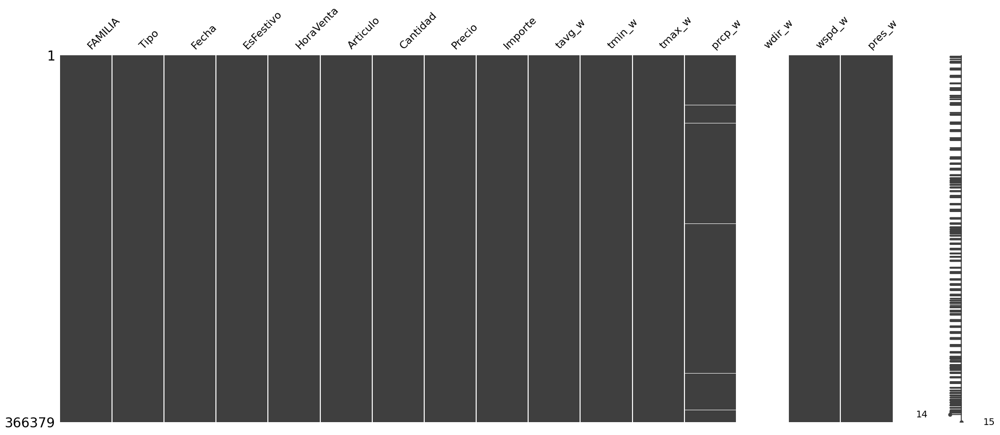

In [18]:
msno.matrix(df_clima)
# Porcentaje de nulos
print("\nPorcentaje de nulos por columna:")
print((df_clima.isnull().sum() / len(df_clima) * 100).round(2))

Como podemos ver la columna wdir_w esta completamente vacia, por ende vamos a eliminarla.

In [19]:
df_clima.drop(columns=["wdir_w"], inplace=True)

Eliminamos o rellenamos los nulos de prcp_w (precipitaciones), la opción que veo es rellenar los datos con 0mm, es decir, asumir que no llovió.

In [20]:
df_clima["prcp_w"].fillna(0, inplace=True)

The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.




In [21]:
df_clima

,FAMILIA,Tipo,Fecha,EsFestivo,HoraVenta,Articulo,Cantidad,Precio,Importe,tavg_w,tmin_w,tmax_w,prcp_w,wspd_w,pres_w
647860,PANADERIA,VENTA,2021-05-01,No,11,174,3.0,5.048,15.144,17.2,11.9,22.8,0.0,14.2,1014.0
647876,PANADERIA,VENTA,2021-05-01,No,12,174,9.0,5.048,45.432,17.2,11.9,22.8,0.0,14.2,1014.0
647886,PANADERIA,VENTA,2021-05-01,No,13,174,12.0,5.048,60.576,17.2,11.9,22.8,0.0,14.2,1014.0
647900,PANADERIA,VENTA,2021-05-01,No,14,174,6.0,5.048,30.288,17.2,11.9,22.8,0.0,14.2,1014.0
647915,PANADERIA,VENTA,2021-05-01,No,15,174,3.0,5.048,15.144,17.2,11.9,22.8,0.0,14.2,1014.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
938030,PASTELERIA,VENTA,2023-04-05,Miércoles Santo,8,9429,3.0,10.773,32.319,14.4,9.3,20.3,0.0,14.3,1016.1
939483,PASTELERIA,VENTA,2023-04-19,No,8,9429,3.0,10.773,32.319,16.3,13.4,20.9,0.4,11.3,1012.8
939744,PASTELERIA,VENTA,2023-04-22,No,9,9429,3.0,10.773,32.319,20.8,14.8,27.8,0.3,13.5,1011.6
940629,PASTELERIA,VENTA,2023-04-30,No,14,9429,3.0,10.773,32.319,23.1,18.2,27.7,0.0,15.3,1014.9


# EDA PANADERIA SALVADOR

## Aqui empezaremos con el EDA, con las preguntas que nos facilitaron
Este apartado tiene como cometido comprender la estructura del conjunto de datos y ver posibles problemas de calidad que podrían afectar al análisis.

### 1. Describe qué significa cada fila de nuestro conjunto de datos

In [22]:
# Renombrar la columna en df_ventas
df_clima.rename(columns={"FAMILIA": "Familia"}, inplace=True)
df_clima.head()

,Familia,Tipo,Fecha,EsFestivo,HoraVenta,Articulo,Cantidad,Precio,Importe,tavg_w,tmin_w,tmax_w,prcp_w,wspd_w,pres_w
647860,PANADERIA,VENTA,2021-05-01,No,11,174,3.0,5.048,15.144,17.2,11.9,22.8,0.0,14.2,1014.0
647876,PANADERIA,VENTA,2021-05-01,No,12,174,9.0,5.048,45.432,17.2,11.9,22.8,0.0,14.2,1014.0
647886,PANADERIA,VENTA,2021-05-01,No,13,174,12.0,5.048,60.576,17.2,11.9,22.8,0.0,14.2,1014.0
647900,PANADERIA,VENTA,2021-05-01,No,14,174,6.0,5.048,30.288,17.2,11.9,22.8,0.0,14.2,1014.0
647915,PANADERIA,VENTA,2021-05-01,No,15,174,3.0,5.048,15.144,17.2,11.9,22.8,0.0,14.2,1014.0


Cada fila de "df_clima" representa una venta individual de un producto Articulo en una fecha concreta con su:

- Cantidad vendida

- Precio e importe

- Información del producto (tipo, familia)

- condiciones climáticas de ese día (temperatura, precipitación, viento…)

### 2. ¿Cuántos valores únicos hay en cada una de las variables? ¿Qué insight podrías observar al comparar los valores únicos de la variable "articulo" con los valores únicos de la variable "precio"?

In [23]:
df_clima.nunique().sort_values(ascending=False)

Importe      4772
Cantidad     1648
Fecha         748
tmax_w        221
pres_w        217
tmin_w        214
tavg_w        200
wspd_w        197
Articulo      170
Precio        120
prcp_w         59
EsFestivo      27
HoraVenta      17
Familia         3
Tipo            2
dtype: int64

In [24]:
articulo_precio = df_clima.groupby("Articulo")["Precio"].nunique().reset_index()
articulo_precio.columns = ["Articulo", "PreciosUnicos"]
art_precio_con_cambios = articulo_precio[articulo_precio["PreciosUnicos"] > 1]
art_precio_con_cambios

,Articulo,PreciosUnicos
0,174,4
1,387,5
2,417,4
3,446,2
4,498,4
...,...,...
152,9148,2
154,9161,2
156,9189,2
157,9190,2


Si un artículo tiene más de un precio, puede significar -> Promociones, cambios de coste con el tiempo o incluso errores de registro.

    

    

### 3. ¿Cuántos valores nulos hay en cada una de las variables?

In [25]:
# No se mostraran nulos porque ya los hemos rellenado o eliminado anteriormente
df_clima.isnull().sum()

Familia      0
Tipo         0
Fecha        0
EsFestivo    0
HoraVenta    0
Articulo     0
Cantidad     0
Precio       0
Importe      0
tavg_w       0
tmin_w       0
tmax_w       0
prcp_w       0
wspd_w       0
pres_w       0
dtype: int64

### 4. ¿Hay duplicados?

In [26]:
df_clima.duplicated().sum()

np.int64(0)

### 5. ¿Cuál es el rango de fechas de nuestro conjunto de datos? Si se divide por producto, ¿hay fechas faltantes? Crea un gráfico de evolución temporal para la variable "cantidad" que muestre el producto "6549".

In [27]:
min_date = df_clima["Fecha"].min()
max_date = df_clima["Fecha"].max()

print("Desde:", min_date)
print("Hasta:", max_date)

Desde: 2021-05-01 00:00:00
Hasta: 2023-05-18 00:00:00


In [28]:
# 1. Calcular el total de días disponibles en el dataset
total_dias = (df_clima["Fecha"].max() - df_clima["Fecha"].min()).days + 1

# 2. Calcular el número de días únicos registrados por producto
fechas_por_producto = df_clima.groupby("Articulo")["Fecha"].nunique().reset_index()
fechas_por_producto.columns = ["Articulo", "DiasConVenta"]

# 3. Calcular cuántos días faltan
fechas_por_producto["FechasFaltantes"] = total_dias - fechas_por_producto["DiasConVenta"]

# 4. Mostrar resultado
fechas_por_producto.head()

,Articulo,DiasConVenta,FechasFaltantes
0,174,740,8
1,387,157,591
2,417,748,0
3,446,19,729
4,498,748,0


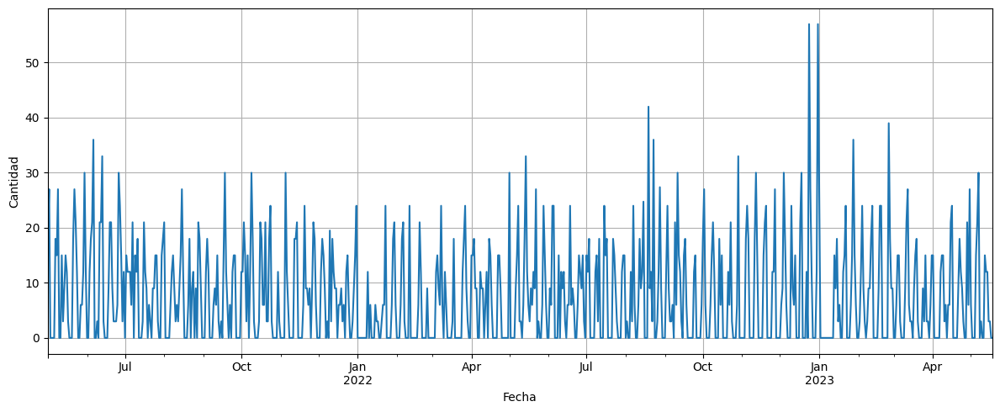

In [29]:
# Gráfico de la cantidad del producto "6549"
# Asegúrate de que la columna de fechas esté bien
df_clima["Fecha"] = pd.to_datetime(df_clima["Fecha"])

# Filtrar solo el producto 6549
articulo = 6549
df_producto = df_clima[df_clima["Articulo"] == articulo].copy()

# Agrupar por fecha (cantidad diaria)
ventas_diarias = df_producto.groupby("Fecha")["Cantidad"].sum()

# Crear un rango completo de fechas
rango_fechas = pd.date_range(start=df_clima["Fecha"].min(), end=df_clima["Fecha"].max())

# Reindexar para que se vean días sin ventas como 0
ventas_diarias = ventas_diarias.reindex(rango_fechas, fill_value=0)

# Crear gráfico
plt.figure(figsize=(12, 5))
ventas_diarias.plot()
plt.xlabel("Fecha")
plt.ylabel("Cantidad")
plt.grid(True)
plt.tight_layout()
plt.show()

### 6. Separando por producto, ¿hay outliers en la variable "cantidad"?

In [30]:
# Outliers en cantidad desglosando por producto
unique_articles = df_clima.sort_values("Familia")["Articulo"].unique().tolist()

for article in unique_articles:

    subset = df_clima.query("Articulo == @article")
    family = subset["Familia"].unique().tolist()[0]

    Q1 = subset['Cantidad'].quantile(0.25)
    Q3 = subset['Cantidad'].quantile(0.75)
    IQR = Q3 - Q1

    outliers = subset[(subset['Cantidad'] < (Q1 - 1.5 * IQR)) | (subset['Cantidad'] > (Q3 + 1.5 * IQR))]

    print(family, "-> Articulo", article, "-> Outliers", len(outliers["Cantidad"]))


BOLLERIA -> Articulo 3960 -> Outliers 372
BOLLERIA -> Articulo 8002 -> Outliers 153
BOLLERIA -> Articulo 8003 -> Outliers 129
BOLLERIA -> Articulo 8029 -> Outliers 119
BOLLERIA -> Articulo 6630 -> Outliers 210
BOLLERIA -> Articulo 6628 -> Outliers 235
BOLLERIA -> Articulo 6645 -> Outliers 12
BOLLERIA -> Articulo 6691 -> Outliers 20
BOLLERIA -> Articulo 6709 -> Outliers 14
BOLLERIA -> Articulo 7351 -> Outliers 18
BOLLERIA -> Articulo 5693 -> Outliers 0
BOLLERIA -> Articulo 6708 -> Outliers 7
BOLLERIA -> Articulo 9148 -> Outliers 24
BOLLERIA -> Articulo 9147 -> Outliers 26
BOLLERIA -> Articulo 9189 -> Outliers 11
BOLLERIA -> Articulo 9145 -> Outliers 33
BOLLERIA -> Articulo 3979 -> Outliers 105
BOLLERIA -> Articulo 9190 -> Outliers 8
BOLLERIA -> Articulo 9328 -> Outliers 8
BOLLERIA -> Articulo 9191 -> Outliers 11
BOLLERIA -> Articulo 8720 -> Outliers 41
BOLLERIA -> Articulo 8719 -> Outliers 25
BOLLERIA -> Articulo 9075 -> Outliers 30
BOLLERIA -> Articulo 8910 -> Outliers 4
BOLLERIA -> Ar

#### 7. Crea un gráfico de la evolución temporal general de la variable "cantidad". Nota: Se debe de agrupar.

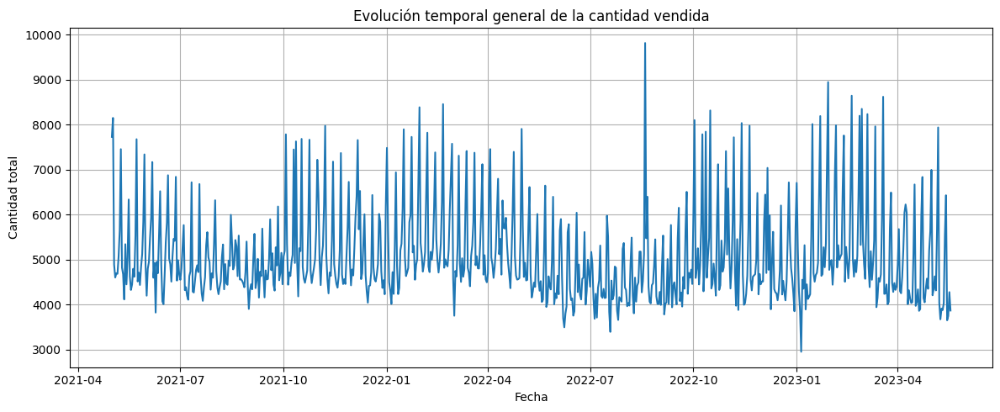

In [31]:
# 7. Crea un gráfico de la evolución temporal general de la variable "cantidad". Nota: Se debe de agrupar.

# Agrupación general por fecha
cantidad_total_diaria = df_clima.groupby("Fecha")["Cantidad"].sum().reset_index()

# Gráfico
plt.figure(figsize=(12,5))
sns.lineplot(data=cantidad_total_diaria, x="Fecha", y="Cantidad")
plt.title("Evolución temporal general de la cantidad vendida")
plt.xlabel("Fecha")
plt.ylabel("Cantidad total")
plt.grid(True)
plt.tight_layout()
plt.show()

#### 8. Crea un gráfico de la evolución temporal por familia de la variable "cantidad". Nota: Se debe de agrupar.

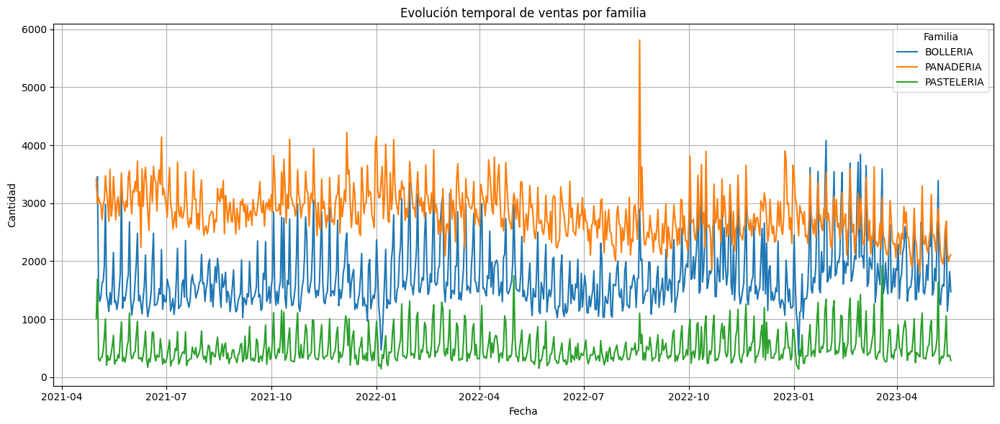

In [32]:
# 8. Crea un gráfico de la evolución temporal por familia de la variable "cantidad". Nota: Se debe de agrupar.

# Agrupar por fecha y familia
cantidad_familia_diaria = df_clima.groupby(["Fecha", "Familia"])["Cantidad"].sum().reset_index()

# Gráfico
plt.figure(figsize=(14,6))
sns.lineplot(data=cantidad_familia_diaria, x="Fecha", y="Cantidad", hue="Familia")
plt.title("Evolución temporal de ventas por familia")
plt.xlabel("Fecha")
plt.ylabel("Cantidad")
plt.grid(True)
plt.tight_layout()
plt.show()

#### 9. Crea un gráfico de la evolución temporal por artículo de la variable "cantidad". Nota: Se debe de agrupar.

The palette list has fewer values (5) than needed (10) and will cycle, which may produce an uninterpretable plot.


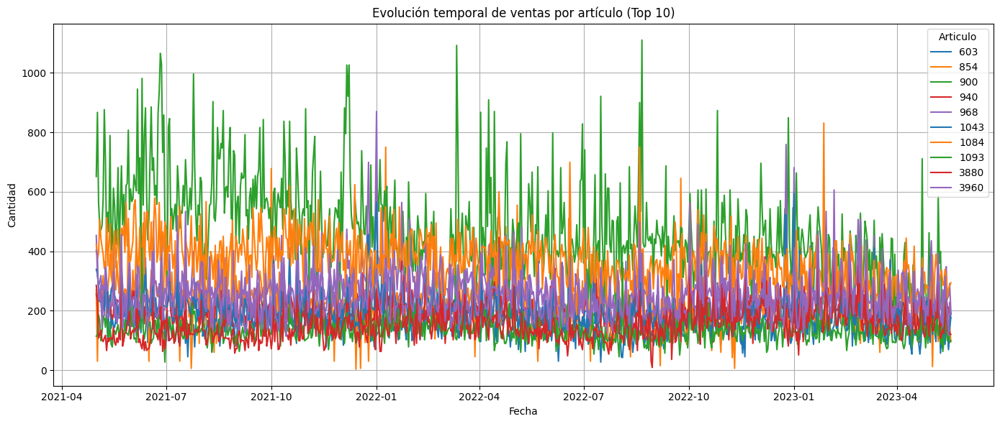

In [33]:
# 9. Crea un gráfico de la evolución temporal por artículo de la variable "cantidad". Nota: Se debe de agrupar.

# Artículos más vendidos
top_articulos = df_clima.groupby("Articulo")["Cantidad"].sum().nlargest(10).index

# Filtrar DataFrame para esos artículos
df_top_art = df_clima[df_clima["Articulo"].isin(top_articulos)]

# Agrupar por fecha y artículo
cantidad_articulo_diaria = df_top_art.groupby(["Fecha", "Articulo"])["Cantidad"].sum().reset_index()


# Lista de colores
colores_personalizados = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd"]

# Crear el gráfico con colores definidos
plt.figure(figsize=(14,6))
sns.lineplot(
    data=cantidad_articulo_diaria,
    x="Fecha",
    y="Cantidad",
    hue="Articulo",
    palette=colores_personalizados
)

plt.title("Evolución temporal de ventas por artículo (Top 10)")
plt.xlabel("Fecha")
plt.ylabel("Cantidad")
plt.grid(True)
plt.tight_layout()
plt.show()



#### 10. Se que hay mucho ruido, pero ¿a simple vista crees que hay tendencia y/o estacionalidad en las series temporales anteriores?
A simple vista, no se observa una tendencia como tal y diria que tampoco estacionalidad en la evolución dtemporal de los 10 articulos más vendidos (he escogido 10 articulos porque creo que poner todos es demasiada información)

#### 11. Aplica alguna técnica estadística para observar si hay estacionalidad en la evolucion temporal general de la variable "cantidad". Pista: Tomar la primera diferencia y, después, hacer un analisis de autocorrelación.

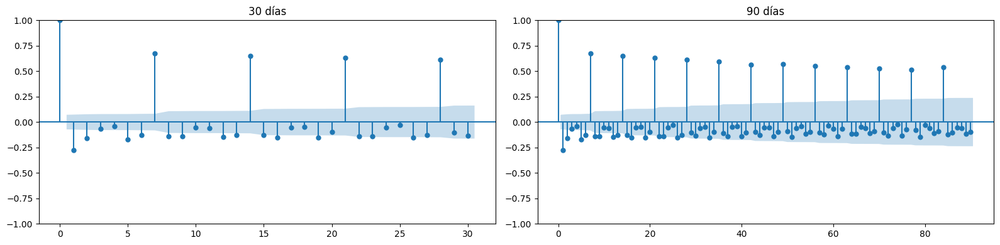

In [34]:
# Agrupar todas las ventas por fecha
cantidad_diaria = df_clima.groupby("Fecha")["Cantidad"].sum()

# Tomar la primera diferencia (para hacer la serie más "estacionaria")
cantidad_diff = cantidad_diaria.diff().dropna()

# Crear subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 4))  # 1 fila, 2 columnas

#  Autocorrelación (ACF) con statsmodels
# Utilizamos la autocorrelación para ver la relación entre las observaciones de la serie temporal en diferentes momento
# si escogieramos un gafico lineal, muestra la evolución de las ventas, pero no nos dice si hay patrones repetitivos en el tiempo
# (A SIMPLE VISTA SI PODRIAMOS OBSERVAR SI HAY O NO ESOS PATRONES, PERO NO ES LO MEJOR)

# ACF con 30 lags (para hacer una autocorrelacion de 30 dias y ver patrones semanales)
plot_acf(cantidad_diff, lags=30, ax=axes[0])
axes[0].set_title("30 días")

# ACF con 90 lags (para hacer una autocorrelacion de 90 dias y ver patrones mensuales i/o trimestrales)
plot_acf(cantidad_diff, lags=90, ax=axes[1])
axes[1].set_title("90 días")

plt.tight_layout()
plt.show()




#### 12. Sin aplicar la primera diferencia y creando nuevas columnas de fecha a partir de la variable "fecha_venta" (semana del año, mes del año, día de la semana, día del mes, día del año) comprueba realizando diferentes agrupaciones y gráficos si nuestro análisis de autocorrelación de nuestra variable cantidad nos mostraba lo correcto. Si encuentras algún gráfico que te llame la atención, baja el nivel del análisis (Ej: 1. Cantidad general -> 2. Cantidad por familia -> 3. Cantidad por artículo).

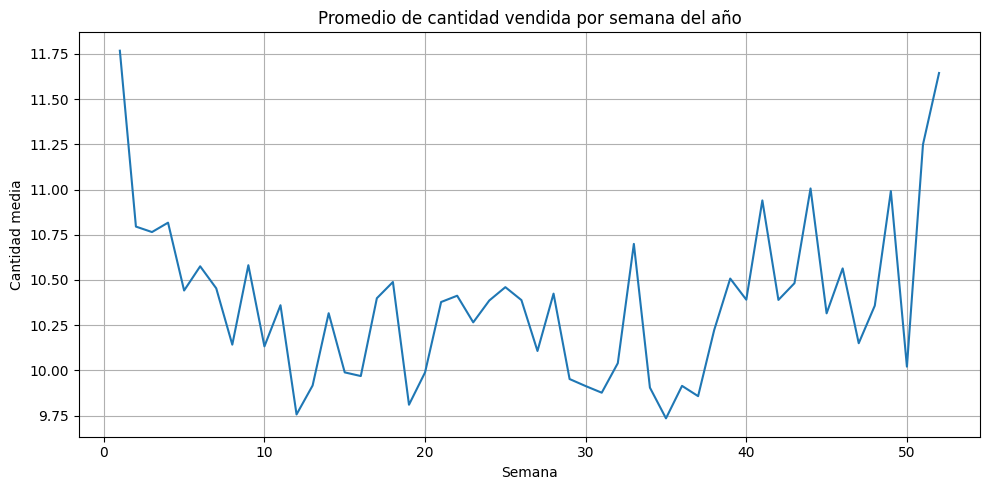

In [35]:
# 12
# Creamos columnas basadas en la fecha
df_clima["Semana"] = df_clima["Fecha"].dt.isocalendar().week
df_clima["Mes"] = df_clima["Fecha"].dt.month
df_clima["DiaSemana"] = df_clima["Fecha"].dt.day_name()
df_clima["DiaMes"] = df_clima["Fecha"].dt.day
df_clima["DiaAnio"] = df_clima["Fecha"].dt.dayofyear

# Agrupación por semana del año (para detectar estacionalidad semanal)
semanal = df_clima.groupby("Semana")["Cantidad"].mean().reset_index()

plt.figure(figsize=(10,5))
sns.lineplot(data=semanal, x="Semana", y="Cantidad")
plt.title("Promedio de cantidad vendida por semana del año")
plt.xlabel("Semana")
plt.ylabel("Cantidad media")
plt.grid(True)
plt.tight_layout()
plt.show()

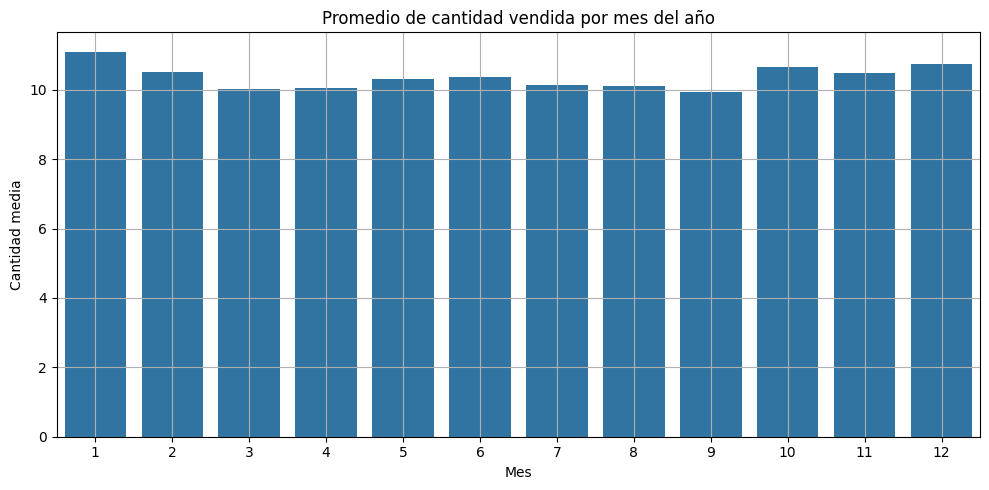

In [36]:
mensual = df_clima.groupby("Mes")["Cantidad"].mean().reset_index()

plt.figure(figsize=(10,5))
sns.barplot(data=mensual, x="Mes", y="Cantidad")
plt.title("Promedio de cantidad vendida por mes del año")
plt.xlabel("Mes")
plt.ylabel("Cantidad media")
plt.grid(True)
plt.tight_layout()
plt.show()

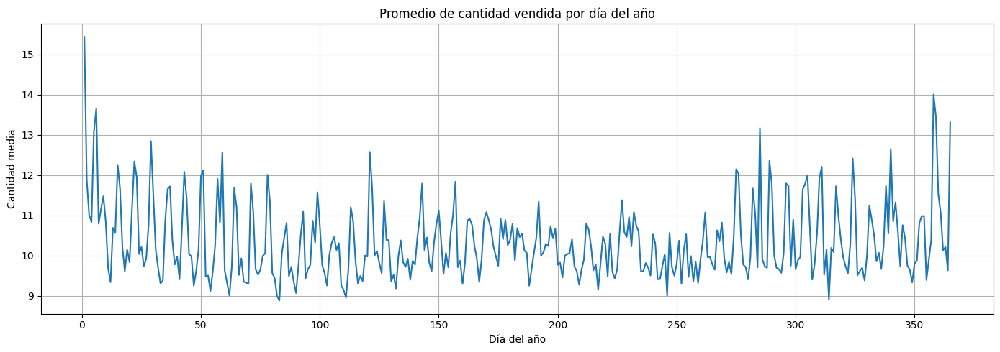

In [37]:
diario_anual = df_clima.groupby("DiaAnio")["Cantidad"].mean().reset_index()

plt.figure(figsize=(14,5))
sns.lineplot(data=diario_anual, x="DiaAnio", y="Cantidad")
plt.title("Promedio de cantidad vendida por día del año")
plt.xlabel("Día del año")
plt.ylabel("Cantidad media")
plt.grid(True)
plt.tight_layout()
plt.show()

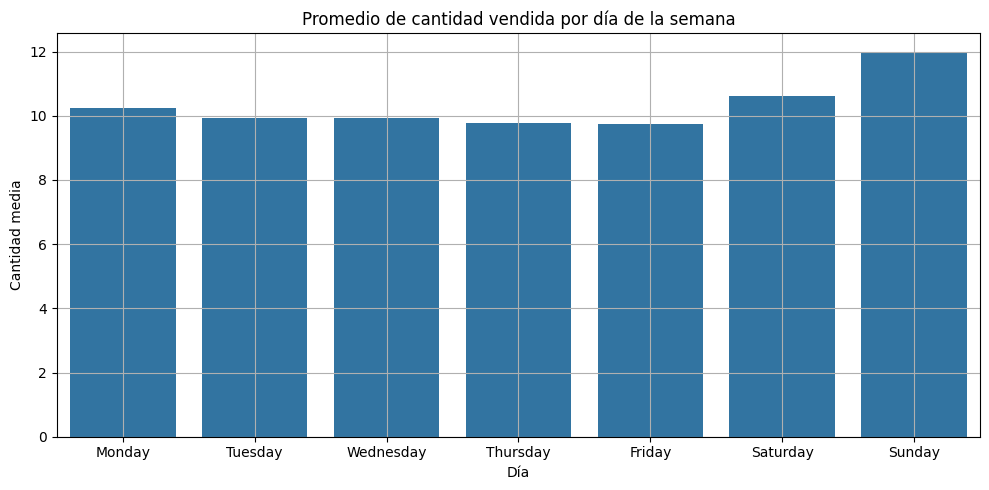

In [38]:
orden_dias = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
dia_semana = df_clima.groupby("DiaSemana")["Cantidad"].mean().reindex(orden_dias).reset_index()

plt.figure(figsize=(10,5))
sns.barplot(data=dia_semana, x="DiaSemana", y="Cantidad")
plt.title("Promedio de cantidad vendida por día de la semana")
plt.xlabel("Día")
plt.ylabel("Cantidad media")
plt.grid(True)
plt.tight_layout()
plt.show()

Parece que los graficos confirman lo que mostró la autocorrelación que hicimos en la pregunta 11, pero de forma visual y mucho más específica.

Cantidad total general (semanas 51–52)

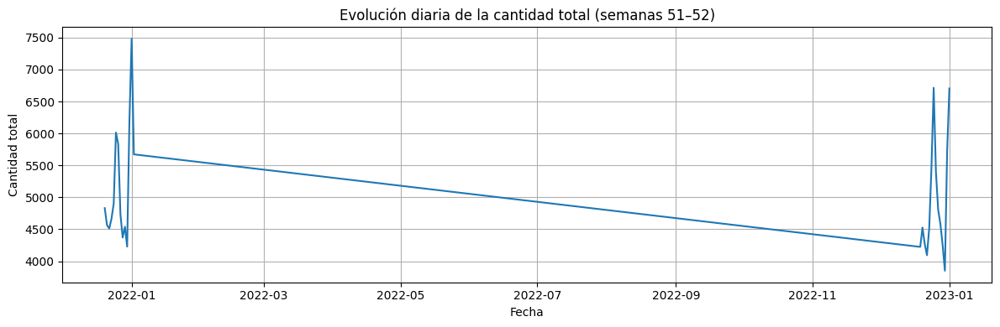

In [39]:
# Filtrar semanas 51–52
df_pico_semanal = df_clima[df_clima["Semana"].isin([51, 52])]

# Agrupar por fecha
cantidad_general = df_pico_semanal.groupby("Fecha")["Cantidad"].sum().reset_index()

# Gráfico
plt.figure(figsize=(12, 4))
sns.lineplot(data=cantidad_general, x="Fecha", y="Cantidad")
plt.title("Evolución diaria de la cantidad total (semanas 51–52)")
plt.xlabel("Fecha")
plt.ylabel("Cantidad total")
plt.grid(True)
plt.tight_layout()
plt.show()

Cantidad por familia

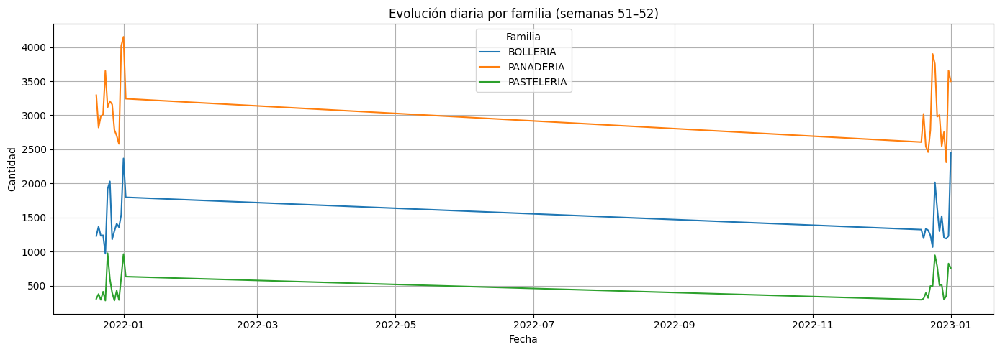

In [40]:
# Agrupar por fecha y familia
cantidad_familia = df_pico_semanal.groupby(["Fecha", "Familia"])["Cantidad"].sum().reset_index()

# Gráfico
plt.figure(figsize=(14, 5))
sns.lineplot(data=cantidad_familia, x="Fecha", y="Cantidad", hue="Familia")
plt.title("Evolución diaria por familia (semanas 51–52)")
plt.xlabel("Fecha")
plt.ylabel("Cantidad")
plt.grid(True)
plt.tight_layout()
plt.show()

Cantidad por artículo

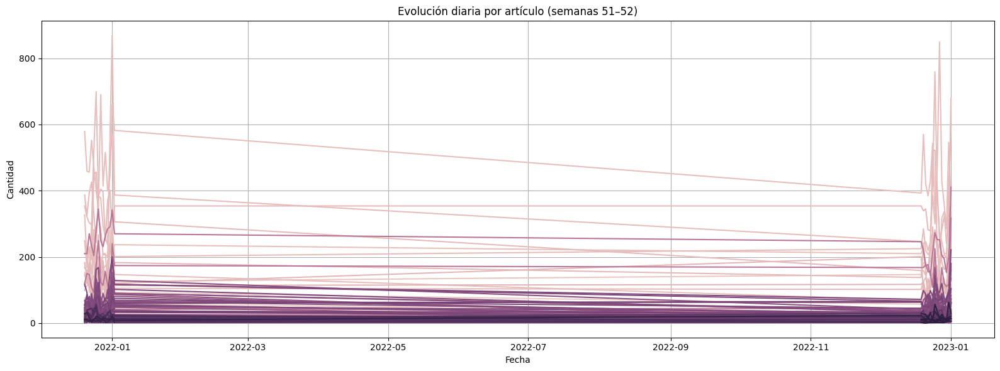

In [41]:
# Agrupar por fecha y artículo
cantidad_articulo = df_pico_semanal.groupby(["Fecha", "Articulo"])["Cantidad"].sum().reset_index()

# Gráfico
plt.figure(figsize=(16, 6))
sns.lineplot(data=cantidad_articulo, x="Fecha", y="Cantidad", hue="Articulo", legend=False)
plt.title("Evolución diaria por artículo (semanas 51–52)")
plt.xlabel("Fecha")
plt.ylabel("Cantidad")
plt.grid(True)
plt.tight_layout()
plt.show()

#### 13. ¿El comportamiento de compra (la variable cantidad) cuando es festivo es superior a cuando no lo es?

In [42]:
# 1. Eliminar columnas que no estoy utilizando y me sobraban
df_clima.drop(columns=["es_festivo", "es_festivo_x", "es_festivo_y"], errors="ignore", inplace=True)


In [43]:
df_clima["EsFestivo"].value_counts()

EsFestivo
No                                                  336074
Feria de Málaga                                       3747
Día de la Madre                                       1877
Día de la Cruz                                        1385
Día del Padre                                         1204
Domingo de Ramos                                      1180
Día de la Hispanidad (Fiesta Nacional de España)      1175
Día de la Constitución                                1162
Sábado Santo                                          1137
Día de Todos los Santos                               1086
Jueves Santo                                          1073
Día de San Valentín                                   1070
Viernes Santo                                         1063
Domingo de Resurrección                               1061
Noche de Halloween                                    1047
Martes Santo                                          1011
Día de la Virgen del Carmen                   

In [44]:
fig = px.box(df_clima, x="EsFestivo", y="Cantidad", color="Familia",
             labels={"es_festivo": "¿Es festivo?", "Cantidad": "Cantidad vendida"},
             title="Ventas por familia: festivo vs no festivo")
fig.show()

#### 14. ¿El comportamiento de compra (la variable Cantidad) cuando llueve es superior a cuando no llueve?

In [45]:
# Crear variable binaria: llueve o no
df_clima["Llueve"] = df_clima["prcp_w"].apply(lambda x: 1 if x > 0 else 0)

# Gráfico boxplot
import plotly.express as px

fig = px.box(df_clima, x="Llueve", y="Cantidad", color="Familia",
             labels={"Llueve": "¿Llueve?", "Cantidad": "Cantidad vendida"},
             title="Ventas por familia: llueve vs no llueve")
fig.show()

A simple vista, la cantidad vendida disminuye cuando llueve. El comportamiento de compra parece estar influido por la presencia de lluvia, pero tampoco algo muy extremista, simplemente un poco de nada.

#### 15. Divide la variable tavg_w (temperatura media) en quintiles y muestra con un gráfico de barras si la cantidad es superior en alguno de sus quintiles.

In [46]:
labels_tavg = ['Temperatura muy baja',
               'Temperatura baja',
               'Temperatura normal',
               'Temperatura alta',
               'Temperatura muy alta']

df_clima['quintiles_tavg_w'] = pd.qcut(df_clima['tavg_w'], q=5, labels=labels_tavg)

group = df_clima.groupby(["Familia", "quintiles_tavg_w"])["Cantidad"].sum().reset_index()
fig = px.bar(group, x='quintiles_tavg_w', y='Cantidad', color="Familia",barmode='group')
fig.show()

/tmp/ipykernel_3699/1053888524.py:9: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



#### 16. ¿Un incremento en el precio reduce la propensión a consumir de un artículo?

In [47]:
# Calcular correlación precio-cantidad por artículo
correlaciones = df_clima.groupby("Articulo")[["Precio", "Cantidad"]].corr().iloc[0::2,-1].reset_index()
correlaciones = correlaciones[["Articulo", "Cantidad"]]  # esta columna representa la correlación Precio vs Cantidad
correlaciones.columns = ["Articulo", "Correlacion_Precio_Cantidad"]

# Mostrar las correlaciones más negativas (cuando sube el precio, baja la cantidad)
correlaciones.sort_values("Correlacion_Precio_Cantidad").head(10)

,Articulo,Correlacion_Precio_Cantidad
24,1448,-0.994752
73,5787,-0.360664
40,3863,-0.316591
81,5854,-0.308469
120,6691,-0.271812
47,5336,-0.239720
86,6040,-0.235888
62,5618,-0.184779
36,2854,-0.170887
112,6539,-0.129983


# Modelos Predictivos

Preguntas clave en el proceso de creación de un modelo predicción de series temporales

- ¿Qué vaiable quiero predecir? (cantidad)
- ¿Qué ventana temporal quiero predecir? (desde cuando vamos a utilizar los datos)
- ¿cada cuanto se actualiza mi BBDD con datos nuevos?
- ¿Cuánto tarda mi modelo en entrenar?
- ¿Qué dis influyen mán en mi target?
- ¿Qué patrón se suele repetir?
- ¿Qué variable exógenas son las que mán influyen?

In [48]:
df_clima

,Familia,Tipo,Fecha,EsFestivo,HoraVenta,Articulo,Cantidad,Precio,Importe,tavg_w,tmin_w,tmax_w,prcp_w,wspd_w,pres_w,Semana,Mes,DiaSemana,DiaMes,DiaAnio,Llueve,quintiles_tavg_w
647860,PANADERIA,VENTA,2021-05-01,No,11,174,3.0,5.048,15.144,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
647876,PANADERIA,VENTA,2021-05-01,No,12,174,9.0,5.048,45.432,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
647886,PANADERIA,VENTA,2021-05-01,No,13,174,12.0,5.048,60.576,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
647900,PANADERIA,VENTA,2021-05-01,No,14,174,6.0,5.048,30.288,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
647915,PANADERIA,VENTA,2021-05-01,No,15,174,3.0,5.048,15.144,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
938030,PASTELERIA,VENTA,2023-04-05,Miércoles Santo,8,9429,3.0,10.773,32.319,14.4,9.3,20.3,0.0,14.3,1016.1,14,4,Wednesday,5,95,0,Temperatura baja
939483,PASTELERIA,VENTA,2023-04-19,No,8,9429,3.0,10.773,32.319,16.3,13.4,20.9,0.4,11.3,1012.8,16,4,Wednesday,19,109,1,Temperatura baja
939744,PASTELERIA,VENTA,2023-04-22,No,9,9429,3.0,10.773,32.319,20.8,14.8,27.8,0.3,13.5,1011.6,16,4,Saturday,22,112,1,Temperatura normal
940629,PASTELERIA,VENTA,2023-04-30,No,14,9429,3.0,10.773,32.319,23.1,18.2,27.7,0.0,15.3,1014.9,17,4,Sunday,30,120,0,Temperatura alta


### Análisis inicial

In [49]:
import datetime

In [50]:
df_clima

,Familia,Tipo,Fecha,EsFestivo,HoraVenta,Articulo,Cantidad,Precio,Importe,tavg_w,tmin_w,tmax_w,prcp_w,wspd_w,pres_w,Semana,Mes,DiaSemana,DiaMes,DiaAnio,Llueve,quintiles_tavg_w
647860,PANADERIA,VENTA,2021-05-01,No,11,174,3.0,5.048,15.144,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
647876,PANADERIA,VENTA,2021-05-01,No,12,174,9.0,5.048,45.432,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
647886,PANADERIA,VENTA,2021-05-01,No,13,174,12.0,5.048,60.576,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
647900,PANADERIA,VENTA,2021-05-01,No,14,174,6.0,5.048,30.288,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
647915,PANADERIA,VENTA,2021-05-01,No,15,174,3.0,5.048,15.144,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
938030,PASTELERIA,VENTA,2023-04-05,Miércoles Santo,8,9429,3.0,10.773,32.319,14.4,9.3,20.3,0.0,14.3,1016.1,14,4,Wednesday,5,95,0,Temperatura baja
939483,PASTELERIA,VENTA,2023-04-19,No,8,9429,3.0,10.773,32.319,16.3,13.4,20.9,0.4,11.3,1012.8,16,4,Wednesday,19,109,1,Temperatura baja
939744,PASTELERIA,VENTA,2023-04-22,No,9,9429,3.0,10.773,32.319,20.8,14.8,27.8,0.3,13.5,1011.6,16,4,Saturday,22,112,1,Temperatura normal
940629,PASTELERIA,VENTA,2023-04-30,No,14,9429,3.0,10.773,32.319,23.1,18.2,27.7,0.0,15.3,1014.9,17,4,Sunday,30,120,0,Temperatura alta


In [51]:
df_clima[["Familia", "Articulo"]].drop_duplicates().sort_values("Familia").reset_index(drop=True)

,Familia,Articulo
0,BOLLERIA,6008
1,BOLLERIA,6273
2,BOLLERIA,2853
3,BOLLERIA,2854
4,BOLLERIA,2859
...,...,...
165,PASTELERIA,5336
166,PASTELERIA,5337
167,PASTELERIA,5394
168,PASTELERIA,5644


In [52]:
family= "BOLLERIA"
item = 3960

itemdata = df_clima.loc[((df_clima["Familia"] == family) & (df_clima["Articulo"] == item))].reset_index(drop=True).copy()
itemdata["Fecha"] = pd.to_datetime(itemdata["Fecha"])
itemdata.sort_values("Fecha", ascending=True, inplace=True)
itemdata

,Familia,Tipo,Fecha,EsFestivo,HoraVenta,Articulo,Cantidad,Precio,Importe,tavg_w,tmin_w,tmax_w,prcp_w,wspd_w,pres_w,Semana,Mes,DiaSemana,DiaMes,DiaAnio,Llueve,quintiles_tavg_w
0,BOLLERIA,VENTA,2021-05-01,No,8,3960,42.0,2.318,97.356,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
12,BOLLERIA,VENTA,2021-05-01,No,20,3960,24.0,2.318,55.632,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
11,BOLLERIA,VENTA,2021-05-01,No,19,3960,36.0,2.318,83.448,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
10,BOLLERIA,VENTA,2021-05-01,No,18,3960,48.0,2.318,111.264,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
8,BOLLERIA,VENTA,2021-05-01,No,16,3960,24.0,2.318,55.632,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9391,BOLLERIA,VENTA,2023-05-18,No,9,3960,12.0,3.273,39.276,17.0,13.7,22.3,13.3,14.3,1016.2,20,5,Thursday,18,138,1,Temperatura baja
9390,BOLLERIA,VENTA,2023-05-18,No,8,3960,18.0,3.273,58.914,17.0,13.7,22.3,13.3,14.3,1016.2,20,5,Thursday,18,138,1,Temperatura baja
9400,BOLLERIA,VENTA,2023-05-18,No,19,3960,12.0,3.273,39.276,17.0,13.7,22.3,13.3,14.3,1016.2,20,5,Thursday,18,138,1,Temperatura baja
9394,BOLLERIA,VENTA,2023-05-18,No,12,3960,18.0,3.273,58.914,17.0,13.7,22.3,13.3,14.3,1016.2,20,5,Thursday,18,138,1,Temperatura baja


In [53]:
itemdata["EsFestivo"].unique()

array(['No', 'Día de la Madre', 'Día de la Cruz', 'Día de San Juan',
       'Día de la Virgen del Carmen', 'Día de la Victoria',
       'Fiesta de la Virgen de la Victoria',
       'Día de la Hispanidad (Fiesta Nacional de España)',
       'Noche de Halloween', 'Día de Todos los Santos',
       'Día de la Constitución', 'Nochebuena', 'Navidad', 'Nochevieja',
       'Año Nuevo', 'Día de Reyes', 'Día de San Valentín',
       'Día del Padre', 'Domingo de Ramos', 'Lunes Santo', 'Martes Santo',
       'Miércoles Santo', 'Jueves Santo', 'Viernes Santo', 'Sábado Santo',
       'Domingo de Resurrección', 'Feria de Málaga'], dtype=object)

Añadimos un dia festivo extra por que puede que el cliente nos pidiera saber ventas en X dia (hemos puesto "Día de la Inmaculada")

In [54]:
itemdata.loc[itemdata["Fecha"] == datetime.datetime(2021, 12, 8), "EsFestivo"] = "Día de la Inmaculada"
itemdata.loc[itemdata["Fecha"] == datetime.datetime(2022, 12, 8), "EsFestivo"] = "Día de la Inmaculada"

In [55]:
itemdata["EsFestivo"].unique()

array(['No', 'Día de la Madre', 'Día de la Cruz', 'Día de San Juan',
       'Día de la Virgen del Carmen', 'Día de la Victoria',
       'Fiesta de la Virgen de la Victoria',
       'Día de la Hispanidad (Fiesta Nacional de España)',
       'Noche de Halloween', 'Día de Todos los Santos',
       'Día de la Constitución', 'Día de la Inmaculada', 'Nochebuena',
       'Navidad', 'Nochevieja', 'Año Nuevo', 'Día de Reyes',
       'Día de San Valentín', 'Día del Padre', 'Domingo de Ramos',
       'Lunes Santo', 'Martes Santo', 'Miércoles Santo', 'Jueves Santo',
       'Viernes Santo', 'Sábado Santo', 'Domingo de Resurrección',
       'Feria de Málaga'], dtype=object)

In [56]:
import plotly.graph_objects as go 
from plotly.subplots import make_subplots

# Crear subgráfico con dos ejes y dos líneas
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Línea de cantidad vendida
fig.add_trace(
    go.Scatter(x=itemdata["Fecha"], y=itemdata["Cantidad"], name="Cantidad vendida"),
    secondary_y=False,
)

# Línea de festivos (codificamos festivos como 1, no festivos como 0 para graficar)
festivo_numeric = (itemdata["EsFestivo"] != "No").astype(int)
fig.add_trace(
    go.Scatter(x=itemdata["Fecha"], y=itemdata["tavg_w"], name="Día festivo"),
    secondary_y=True,
)

# set x-axis title
fig.update_xaxes(title_text="Fecha")

# set y-axes titles
fig.update_yaxes(title_text="Ventas", secondary_y=False)
fig.update_yaxes(title_text="temp ", secondary_y=True)

fig.show()

Vamos a pasar a hacer la división de los datos de entrenamiento y test

In [57]:
itemSales = itemdata.loc[itemdata["Fecha"] < datetime.datetime(2023, 5, 11)]
itemSalesTest = itemdata.loc[itemdata["Fecha"] >= datetime.datetime(2023, 5, 11)]

In [58]:
itemSalesTest

,Familia,Tipo,Fecha,EsFestivo,HoraVenta,Articulo,Cantidad,Precio,Importe,tavg_w,tmin_w,tmax_w,prcp_w,wspd_w,pres_w,Semana,Mes,DiaSemana,DiaMes,DiaAnio,Llueve,quintiles_tavg_w
9310,BOLLERIA,VENTA,2023-05-11,No,20,3960,6.0,3.273,19.638,19.8,17.3,24.4,0.0,11.8,1015.3,19,5,Thursday,11,131,0,Temperatura normal
9311,BOLLERIA,MERMA,2023-05-11,No,21,3960,9.0,3.273,29.457,19.8,17.3,24.4,0.0,11.8,1015.3,19,5,Thursday,11,131,0,Temperatura normal
9309,BOLLERIA,VENTA,2023-05-11,No,19,3960,18.0,3.273,58.914,19.8,17.3,24.4,0.0,11.8,1015.3,19,5,Thursday,11,131,0,Temperatura normal
9308,BOLLERIA,VENTA,2023-05-11,No,18,3960,6.0,3.273,19.638,19.8,17.3,24.4,0.0,11.8,1015.3,19,5,Thursday,11,131,0,Temperatura normal
9307,BOLLERIA,VENTA,2023-05-11,No,17,3960,27.0,3.273,88.371,19.8,17.3,24.4,0.0,11.8,1015.3,19,5,Thursday,11,131,0,Temperatura normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9391,BOLLERIA,VENTA,2023-05-18,No,9,3960,12.0,3.273,39.276,17.0,13.7,22.3,13.3,14.3,1016.2,20,5,Thursday,18,138,1,Temperatura baja
9390,BOLLERIA,VENTA,2023-05-18,No,8,3960,18.0,3.273,58.914,17.0,13.7,22.3,13.3,14.3,1016.2,20,5,Thursday,18,138,1,Temperatura baja
9400,BOLLERIA,VENTA,2023-05-18,No,19,3960,12.0,3.273,39.276,17.0,13.7,22.3,13.3,14.3,1016.2,20,5,Thursday,18,138,1,Temperatura baja
9394,BOLLERIA,VENTA,2023-05-18,No,12,3960,18.0,3.273,58.914,17.0,13.7,22.3,13.3,14.3,1016.2,20,5,Thursday,18,138,1,Temperatura baja


In [59]:
# Ponemos la fecha como indice para facilitar el analisis
itemSales.set_index("Fecha", inplace=True)

In [60]:
itemSales

,Familia,Tipo,EsFestivo,HoraVenta,Articulo,Cantidad,Precio,Importe,tavg_w,tmin_w,tmax_w,prcp_w,wspd_w,pres_w,Semana,Mes,DiaSemana,DiaMes,DiaAnio,Llueve,quintiles_tavg_w
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-01,BOLLERIA,VENTA,No,8,3960,42.0,2.318,97.356,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
2021-05-01,BOLLERIA,VENTA,No,20,3960,24.0,2.318,55.632,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
2021-05-01,BOLLERIA,VENTA,No,19,3960,36.0,2.318,83.448,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
2021-05-01,BOLLERIA,VENTA,No,18,3960,48.0,2.318,111.264,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
2021-05-01,BOLLERIA,VENTA,No,16,3960,24.0,2.318,55.632,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-10,BOLLERIA,VENTA,No,11,3960,36.0,3.273,117.828,23.1,19.1,27.0,0.0,15.9,1017.0,19,5,Wednesday,10,130,0,Temperatura alta
2023-05-10,BOLLERIA,VENTA,No,10,3960,21.0,3.273,68.733,23.1,19.1,27.0,0.0,15.9,1017.0,19,5,Wednesday,10,130,0,Temperatura alta
2023-05-10,BOLLERIA,VENTA,No,9,3960,15.0,3.273,49.095,23.1,19.1,27.0,0.0,15.9,1017.0,19,5,Wednesday,10,130,0,Temperatura alta


In [61]:
# 
itemSalesComplete = itemSales.resample("1D").last()
itemSales = itemSalesComplete.copy()

In [62]:
itemSales

,Familia,Tipo,EsFestivo,HoraVenta,Articulo,Cantidad,Precio,Importe,tavg_w,tmin_w,tmax_w,prcp_w,wspd_w,pres_w,Semana,Mes,DiaSemana,DiaMes,DiaAnio,Llueve,quintiles_tavg_w
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-01,BOLLERIA,VENTA,No,14,3960,21.0,2.318,48.678,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
2021-05-02,BOLLERIA,VENTA,Día de la Madre,14,3960,27.0,2.318,62.586,16.3,10.8,23.2,0.0,15.7,1015.9,17,5,Sunday,2,122,0,Temperatura baja
2021-05-03,BOLLERIA,VENTA,Día de la Cruz,15,3960,21.0,2.318,48.678,15.3,12.7,20.1,6.5,9.7,1017.7,18,5,Monday,3,123,1,Temperatura baja
2021-05-04,BOLLERIA,VENTA,No,13,3960,27.0,2.318,62.586,16.5,12.0,20.9,0.0,12.1,1018.0,18,5,Tuesday,4,124,0,Temperatura baja
2021-05-05,BOLLERIA,VENTA,No,15,3960,12.0,2.318,27.816,16.7,12.3,21.7,0.0,13.8,1016.5,18,5,Wednesday,5,125,0,Temperatura baja
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-06,BOLLERIA,VENTA,No,12,3960,57.0,3.273,186.561,20.2,15.5,25.9,0.0,11.7,1014.4,18,5,Saturday,6,126,0,Temperatura normal
2023-05-07,BOLLERIA,VENTA,Día de la Madre,13,3960,30.0,3.273,98.190,22.6,18.9,27.2,0.0,20.5,1016.3,18,5,Sunday,7,127,0,Temperatura alta
2023-05-08,BOLLERIA,VENTA,No,12,3960,3.0,3.273,9.819,19.9,17.8,24.2,0.0,10.7,1021.2,19,5,Monday,8,128,0,Temperatura normal


### Convertir el problema a aprendizaje supervisado

In [63]:
itemSales

,Familia,Tipo,EsFestivo,HoraVenta,Articulo,Cantidad,Precio,Importe,tavg_w,tmin_w,tmax_w,prcp_w,wspd_w,pres_w,Semana,Mes,DiaSemana,DiaMes,DiaAnio,Llueve,quintiles_tavg_w
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-01,BOLLERIA,VENTA,No,14,3960,21.0,2.318,48.678,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
2021-05-02,BOLLERIA,VENTA,Día de la Madre,14,3960,27.0,2.318,62.586,16.3,10.8,23.2,0.0,15.7,1015.9,17,5,Sunday,2,122,0,Temperatura baja
2021-05-03,BOLLERIA,VENTA,Día de la Cruz,15,3960,21.0,2.318,48.678,15.3,12.7,20.1,6.5,9.7,1017.7,18,5,Monday,3,123,1,Temperatura baja
2021-05-04,BOLLERIA,VENTA,No,13,3960,27.0,2.318,62.586,16.5,12.0,20.9,0.0,12.1,1018.0,18,5,Tuesday,4,124,0,Temperatura baja
2021-05-05,BOLLERIA,VENTA,No,15,3960,12.0,2.318,27.816,16.7,12.3,21.7,0.0,13.8,1016.5,18,5,Wednesday,5,125,0,Temperatura baja
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-06,BOLLERIA,VENTA,No,12,3960,57.0,3.273,186.561,20.2,15.5,25.9,0.0,11.7,1014.4,18,5,Saturday,6,126,0,Temperatura normal
2023-05-07,BOLLERIA,VENTA,Día de la Madre,13,3960,30.0,3.273,98.190,22.6,18.9,27.2,0.0,20.5,1016.3,18,5,Sunday,7,127,0,Temperatura alta
2023-05-08,BOLLERIA,VENTA,No,12,3960,3.0,3.273,9.819,19.9,17.8,24.2,0.0,10.7,1021.2,19,5,Monday,8,128,0,Temperatura normal


In [113]:
from pandas import DataFrame 
from pandas import concat

def series_to_supervised(data, n_in_daily=1, n_in_weekly=1, n_out=1, dropnan=True):
    """

    Adapta un problema de series temporales a aprendizaje supervisado.
    Arguments:
    data: secuencia de observaciones como numpy array
    n_in daily: ancho de la ventana (n° de observaciones) como input (X). 
    n_out: ancho de la ventana (nº de observaciones) como output (y).
    dropnan: booleano para indicar si elimino los NaN o no
    Returns:
        Pandas DataFrame de la series para aprendizaje supervisado.
    """
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    cols, names = list(), list()

    # input sequence sales for days (t-n, ... t-1)
    for i in range(n_in_daily, 0, -1):
        cols.append(df.shift (1))
        names += [("var%d(t-%d day)" % (j+1, i)) for j in range(n_vars)]

    # input sequence sales for weeks (t-n, ... t-1)
    for i in range(n_in_weekly, 0, -1):
        cols.append(df.shift(i*7))
        names += [("var%d(t-%d week)" % (j+1, i)) for j in range(n_vars)]

    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [("var%d(t)" % (j+1)) for j in range(n_vars)]
        else:
            names += [("var%d(t+%d)" % (j+1, i)) for j in range(n_vars)]
    # Se junta pdo
    agg = concat(cols, axis=1)
    agg.columns = names
    # Eliminación de NaN
    if dropnan:
        agg.dropna(inplace = True)
    
    return agg

In [123]:
itemSales


,Fecha,Familia,Tipo,EsFestivo,HoraVenta,Articulo,Cantidad,Precio,Importe,tavg_w,tmin_w,tmax_w,prcp_w,wspd_w,pres_w,Semana,Mes,DiaSemana,DiaMes,DiaAnio,Llueve,quintiles_tavg_w
0,2021-05-01,BOLLERIA,VENTA,No,14,3960,21.0,2.318,48.678,17.2,11.9,22.8,0.0,14.2,1014.0,17,5,Saturday,1,121,0,Temperatura baja
1,2021-05-02,BOLLERIA,VENTA,Día de la Madre,14,3960,27.0,2.318,62.586,16.3,10.8,23.2,0.0,15.7,1015.9,17,5,Sunday,2,122,0,Temperatura baja
2,2021-05-03,BOLLERIA,VENTA,Día de la Cruz,15,3960,21.0,2.318,48.678,15.3,12.7,20.1,6.5,9.7,1017.7,18,5,Monday,3,123,1,Temperatura baja
3,2021-05-04,BOLLERIA,VENTA,No,13,3960,27.0,2.318,62.586,16.5,12.0,20.9,0.0,12.1,1018.0,18,5,Tuesday,4,124,0,Temperatura baja
4,2021-05-05,BOLLERIA,VENTA,No,15,3960,12.0,2.318,27.816,16.7,12.3,21.7,0.0,13.8,1016.5,18,5,Wednesday,5,125,0,Temperatura baja
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
735,2023-05-06,BOLLERIA,VENTA,No,12,3960,57.0,3.273,186.561,20.2,15.5,25.9,0.0,11.7,1014.4,18,5,Saturday,6,126,0,Temperatura normal
736,2023-05-07,BOLLERIA,VENTA,Día de la Madre,13,3960,30.0,3.273,98.190,22.6,18.9,27.2,0.0,20.5,1016.3,18,5,Sunday,7,127,0,Temperatura alta
737,2023-05-08,BOLLERIA,VENTA,No,12,3960,3.0,3.273,9.819,19.9,17.8,24.2,0.0,10.7,1021.2,19,5,Monday,8,128,0,Temperatura normal
738,2023-05-09,BOLLERIA,VENTA,No,15,3960,12.0,3.273,39.276,20.7,17.0,29.7,0.0,9.7,1018.4,19,5,Tuesday,9,129,0,Temperatura normal


In [115]:
itemSalesSupervised = series_to_supervised(pd.DataFrame(itemSales["Cantidad"]), n_in_daily=4, n_in_weekly=2, n_out=1, dropnan=True)
itemSalesSupervised

,var1(t-4 day),var1(t-3 day),var1(t-2 day),var1(t-1 day),var1(t-2 week),var1(t-1 week),var1(t)
14,6.0,6.0,6.0,6.0,21.0,15.0,21.0
15,21.0,21.0,21.0,21.0,27.0,21.0,12.0
16,12.0,12.0,12.0,12.0,21.0,33.0,6.0
17,6.0,6.0,6.0,6.0,27.0,36.0,6.0
18,6.0,6.0,6.0,6.0,12.0,9.0,3.0
...,...,...,...,...,...,...,...
735,24.0,24.0,24.0,24.0,3.0,42.0,57.0
736,57.0,57.0,57.0,57.0,39.0,42.0,30.0
737,30.0,30.0,30.0,30.0,18.0,12.0,3.0
738,3.0,3.0,3.0,3.0,30.0,12.0,12.0


#### Variables exógenas

##### Variables Meteorológicas

In [119]:
# Sacamos el indice a "Fecha", sino no podremos hacer merge con las variables meteorológicas
itemSales.reset_index(inplace=True)
itemSalesSupervised.reset_index(inplace=True)

In [132]:
print(itemSalesSupervised.columns)

Index(['level_0', 'var1(t-4 day)', 'var1(t-3 day)', 'var1(t-2 day)',
       'var1(t-1 day)', 'var1(t-2 week)', 'var1(t-1 week)', 'var1(t)',
       'Fecha'],
      dtype='object')


In [133]:
meteorvars = ["Fecha", "tavg_w", "tmin_w", "tmax_w", "prcp_w", "Llueve"]

# merge con las variables meteorológicas
itemSalesSupervised = itemSalesSupervised.merge(itemSales[meteorvars], on="Fecha", how="inner")
itemSalesSupervised

,level_0,var1(t-4 day),var1(t-3 day),var1(t-2 day),var1(t-1 day),var1(t-2 week),var1(t-1 week),var1(t),Fecha,tavg_w,tmin_w,tmax_w,prcp_w,Llueve
0,0,6.0,6.0,6.0,6.0,21.0,15.0,21.0,2021-05-01,17.2,11.9,22.8,0.0,0
1,1,21.0,21.0,21.0,21.0,27.0,21.0,12.0,2021-05-02,16.3,10.8,23.2,0.0,0
2,2,12.0,12.0,12.0,12.0,21.0,33.0,6.0,2021-05-03,15.3,12.7,20.1,6.5,1
3,3,6.0,6.0,6.0,6.0,27.0,36.0,6.0,2021-05-04,16.5,12.0,20.9,0.0,0
4,4,6.0,6.0,6.0,6.0,12.0,9.0,3.0,2021-05-05,16.7,12.3,21.7,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
721,721,24.0,24.0,24.0,24.0,3.0,42.0,57.0,2023-04-22,20.8,14.8,27.8,0.3,1
722,722,57.0,57.0,57.0,57.0,39.0,42.0,30.0,2023-04-23,21.2,16.9,26.8,0.0,0
723,723,30.0,30.0,30.0,30.0,18.0,12.0,3.0,2023-04-24,18.4,13.7,25.5,0.0,0
724,724,3.0,3.0,3.0,3.0,30.0,12.0,12.0,2023-04-25,19.4,14.0,28.3,0.0,0


##### Calendario
- festivo, mes, año, dia de la semana
- Diferencio entre dias de la semana y fines de semana?
- Diferencio entre modelos para dias normales y festivos?

In [134]:
itemSalesSupervised["day"] = itemSalesSupervised["Fecha"].dt.day
itemSalesSupervised["dayofweek"] = itemSalesSupervised["Fecha"].dt.dayofweek
itemSalesSupervised["dayofweek"] = itemSalesSupervised["dayofweek"] + 1
itemSalesSupervised["month"] = itemSalesSupervised["Fecha"].dt.month
itemSalesSupervised["year"] = itemSalesSupervised["Fecha"].dt.year
itemSalesSupervised["weekday"] = itemSalesSupervised["dayofweek"] < 6
itemSalesSupervised

,level_0,var1(t-4 day),var1(t-3 day),var1(t-2 day),var1(t-1 day),var1(t-2 week),var1(t-1 week),var1(t),Fecha,tavg_w,tmin_w,tmax_w,prcp_w,Llueve,day,dayofweek,month,year,weekday
0,0,6.0,6.0,6.0,6.0,21.0,15.0,21.0,2021-05-01,17.2,11.9,22.8,0.0,0,1,6,5,2021,False
1,1,21.0,21.0,21.0,21.0,27.0,21.0,12.0,2021-05-02,16.3,10.8,23.2,0.0,0,2,7,5,2021,False
2,2,12.0,12.0,12.0,12.0,21.0,33.0,6.0,2021-05-03,15.3,12.7,20.1,6.5,1,3,1,5,2021,True
3,3,6.0,6.0,6.0,6.0,27.0,36.0,6.0,2021-05-04,16.5,12.0,20.9,0.0,0,4,2,5,2021,True
4,4,6.0,6.0,6.0,6.0,12.0,9.0,3.0,2021-05-05,16.7,12.3,21.7,0.0,0,5,3,5,2021,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
721,721,24.0,24.0,24.0,24.0,3.0,42.0,57.0,2023-04-22,20.8,14.8,27.8,0.3,1,22,6,4,2023,False
722,722,57.0,57.0,57.0,57.0,39.0,42.0,30.0,2023-04-23,21.2,16.9,26.8,0.0,0,23,7,4,2023,False
723,723,30.0,30.0,30.0,30.0,18.0,12.0,3.0,2023-04-24,18.4,13.7,25.5,0.0,0,24,1,4,2023,True
724,724,3.0,3.0,3.0,3.0,30.0,12.0,12.0,2023-04-25,19.4,14.0,28.3,0.0,0,25,2,4,2023,True


#### Codificación
Hay variables para codificar?

In [135]:
from sklearn.preprocessing import LabelBinarizer

# Tranformarmos el codigo booleano a binario ( 0, 1)
lb = LabelBinarizer()
itemSalesSupervised["weekday"] = lb.fit_transform(itemSalesSupervised["weekday"])
itemSalesSupervised

,level_0,var1(t-4 day),var1(t-3 day),var1(t-2 day),var1(t-1 day),var1(t-2 week),var1(t-1 week),var1(t),Fecha,tavg_w,tmin_w,tmax_w,prcp_w,Llueve,day,dayofweek,month,year,weekday
0,0,6.0,6.0,6.0,6.0,21.0,15.0,21.0,2021-05-01,17.2,11.9,22.8,0.0,0,1,6,5,2021,0
1,1,21.0,21.0,21.0,21.0,27.0,21.0,12.0,2021-05-02,16.3,10.8,23.2,0.0,0,2,7,5,2021,0
2,2,12.0,12.0,12.0,12.0,21.0,33.0,6.0,2021-05-03,15.3,12.7,20.1,6.5,1,3,1,5,2021,1
3,3,6.0,6.0,6.0,6.0,27.0,36.0,6.0,2021-05-04,16.5,12.0,20.9,0.0,0,4,2,5,2021,1
4,4,6.0,6.0,6.0,6.0,12.0,9.0,3.0,2021-05-05,16.7,12.3,21.7,0.0,0,5,3,5,2021,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
721,721,24.0,24.0,24.0,24.0,3.0,42.0,57.0,2023-04-22,20.8,14.8,27.8,0.3,1,22,6,4,2023,0
722,722,57.0,57.0,57.0,57.0,39.0,42.0,30.0,2023-04-23,21.2,16.9,26.8,0.0,0,23,7,4,2023,0
723,723,30.0,30.0,30.0,30.0,18.0,12.0,3.0,2023-04-24,18.4,13.7,25.5,0.0,0,24,1,4,2023,1
724,724,3.0,3.0,3.0,3.0,30.0,12.0,12.0,2023-04-25,19.4,14.0,28.3,0.0,0,25,2,4,2023,1


#### Modelado

In [136]:
def plottingResults(comparison):

    comparison["diff"] = comparison["yreal"] - comparison["ypred"]
    fig, ax = plt.subplots(figsize(10, 8))
    comparison["diff"].hist(bins=10, ax=ax)
    ax.set_xticklabels(ax.get_xticks(), fontsize=8)
    ax.set_yticklabels(ax.get_yticks(), fontsize=8)
    ax.set_xlabel("Error",fontname="Serif", fontsize=8)
    ax.set_title("Histograma del error de predicción", fontname="Serif", fontsize=9)

In [137]:
def plottingSeries(comparison, check = True):

    ### Plotting evolution
    if check:
        comparisonplot = comparison.rename({"yreal": "Venta real", "ypred": "Venta predicha ML"}, axis = 1)
        fig = px.line(comparisonplot, x="Fecha", y=["Venta real", "Venta predicha ML"])
        fig.show()
    else:
        comparisonplot = comparison.rename({"Cantidad":"Venta predicha tienda", "yreal": "Venta real", "ypred": "Venta predicha ML"}, axis = 1)
        fig = px.line(comparisonplot, x="Fecha", y=["Venta real",  "Venta predicha ML", "Venta pedricha tienda"])
        fig.show()

In [138]:
def plottingComparison(comparison):

    i = 0
    comparison["line"] = [i+j*(comparison["yreal"].max() + 20 / len(comparison) for j in range(len(comparison)))]
    comparison["line2"] = comparison["line"]

    fig, ax = plt.subplots(figsize=(10, 8))
    comparison.plot(x="line", y="line2", ax=ax, color="red", marker="*", markersize=2)
    comparison.plot.scatter(x="yreal", y="ypred", ax=ax, color="blue")
    ax.gid(True)
    ax.set_yticklabels(ax.get_yticks(minor=False), fontname="Serif", fontsize=8)
    ax.set_xticklabels(ax.get_xticks(minor=False), fontname="Serif", fontsize=8)
    ax.set_xlabel("Ventas reales", fontname="Serif", fontsize=8)
    ax.set_title("Ventas reales vs Ventas predichhas", fontname="Serif", fontsize=8)
    ax.get_legend().remove()

#### Splitting de los datos

Hacemos splitting entre los datos de entrenamiento y datos de test. Lo haremos manualmente para hacer un seguimiento de las fechas que se utilizan

In [139]:
#Reseteamos para recuperar la fecha como columna
itemSalesSupervised.reset_index(drop = True, inplace = True)
testrate = 0.1 # Porcentaje de datos que formarán parte del test
size = int((1-testrate)*len(itemSalesSupervised))

#Datos de entrenamiento
datatrain = itemSalesSupervised.loc[0:(size-1),:]
# Datos de test
datatest = itemSalesSupervised.loc[size:,:]
# Fecha de test. Lo utilizaremos para la representación de los resultados
testdates = datatest["Fecha"].to_list()


#### Escalado de los datos

In [155]:
from sklearn.preprocessing import MinMaxScaler

def tsscale(df, columna_a_guardar="Cantidad"):
    dfScaled = df.copy()
    colstoscaled = df.columns[1:]
    newcols = []
    scalerToUnscale = None

    for i in colstoscaled:
        scaler = MinMaxScaler(feature_range=(-1,1))
        scaler.fit(np.array(df[i]).reshape(-1,1))
        j = i+"_scaled"
        newcols.append(j)
        dfScaled[j] = scaler.transform(np.array(df[i]).reshape(-1,1))
        if i == columna_a_guardar:
            scalerToUnscale = scaler
            
    return dfScaled, scalerToUnscale

In [161]:
# Datos escalados
datatrainscaled, trainunscaler = tsscale(datatrain, columna_a_guardar="Cantidad")
datatestscaled, testunscaler = tsscale(datatest, columna_a_guardar="Cantidad")

In [162]:
datatrainscaled

,level_0,var1(t-4 day),var1(t-3 day),var1(t-2 day),var1(t-1 day),var1(t-2 week),var1(t-1 week),var1(t),Fecha,tavg_w,tmin_w,tmax_w,prcp_w,Llueve,day,dayofweek,month,year,weekday,var1(t-4 day)_scaled,var1(t-3 day)_scaled,var1(t-2 day)_scaled,var1(t-1 day)_scaled,var1(t-2 week)_scaled,var1(t-1 week)_scaled,var1(t)_scaled,Fecha_scaled,tavg_w_scaled,tmin_w_scaled,tmax_w_scaled,prcp_w_scaled,Llueve_scaled,day_scaled,dayofweek_scaled,month_scaled,year_scaled,weekday_scaled
0,0,6.0,6.0,6.0,6.0,21.0,15.0,21.0,2021-05-01,17.2,11.9,22.8,0.0,0,1,6,5,2021,0,-0.944444,-0.944444,-0.944444,-0.944444,-0.666667,-0.777778,-0.666667,-1.000000,-0.244275,-0.181818,-0.351536,-1.000000,-1.0,-1.000000,0.666667,-0.272727,-1.0,-1.0
1,1,21.0,21.0,21.0,21.0,27.0,21.0,12.0,2021-05-02,16.3,10.8,23.2,0.0,0,2,7,5,2021,0,-0.666667,-0.666667,-0.666667,-0.666667,-0.555556,-0.666667,-0.833333,-0.996933,-0.312977,-0.265152,-0.324232,-1.000000,-1.0,-0.933333,1.000000,-0.272727,-1.0,-1.0
2,2,12.0,12.0,12.0,12.0,21.0,33.0,6.0,2021-05-03,15.3,12.7,20.1,6.5,1,3,1,5,2021,1,-0.833333,-0.833333,-0.833333,-0.833333,-0.666667,-0.444444,-0.944444,-0.993865,-0.389313,-0.121212,-0.535836,-0.722222,1.0,-0.866667,-1.000000,-0.272727,-1.0,1.0
3,3,6.0,6.0,6.0,6.0,27.0,36.0,6.0,2021-05-04,16.5,12.0,20.9,0.0,0,4,2,5,2021,1,-0.944444,-0.944444,-0.944444,-0.944444,-0.555556,-0.388889,-0.944444,-0.990798,-0.297710,-0.174242,-0.481229,-1.000000,-1.0,-0.800000,-0.666667,-0.272727,-1.0,1.0
4,4,6.0,6.0,6.0,6.0,12.0,9.0,3.0,2021-05-05,16.7,12.3,21.7,0.0,0,5,3,5,2021,1,-0.944444,-0.944444,-0.944444,-0.944444,-0.833333,-0.888889,-1.000000,-0.987730,-0.282443,-0.151515,-0.426621,-1.000000,-1.0,-0.733333,-0.333333,-0.272727,-1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
648,648,9.0,9.0,9.0,9.0,18.0,21.0,12.0,2023-02-08,12.3,10.1,14.3,14.2,1,8,3,2,2023,1,-0.888889,-0.888889,-0.888889,-0.888889,-0.722222,-0.666667,-0.833333,0.987730,-0.618321,-0.318182,-0.931741,-0.393162,1.0,-0.533333,-0.333333,-0.818182,1.0,1.0
649,649,12.0,12.0,12.0,12.0,18.0,18.0,9.0,2023-02-09,13.7,12.9,15.7,0.0,0,9,4,2,2023,1,-0.833333,-0.833333,-0.833333,-0.833333,-0.722222,-0.722222,-0.888889,0.990798,-0.511450,-0.106061,-0.836177,-1.000000,-1.0,-0.466667,0.000000,-0.818182,1.0,1.0
650,650,9.0,9.0,9.0,9.0,6.0,12.0,18.0,2023-02-10,12.7,12.2,14.1,0.0,0,10,5,2,2023,1,-0.888889,-0.888889,-0.888889,-0.888889,-0.944444,-0.833333,-0.722222,0.993865,-0.587786,-0.159091,-0.945392,-1.000000,-1.0,-0.400000,0.333333,-0.818182,1.0,1.0
651,651,18.0,18.0,18.0,18.0,24.0,6.0,12.0,2023-02-11,13.7,12.5,15.9,0.0,0,11,6,2,2023,0,-0.722222,-0.722222,-0.722222,-0.722222,-0.611111,-0.944444,-0.833333,0.996933,-0.511450,-0.136364,-0.822526,-1.000000,-1.0,-0.333333,0.666667,-0.818182,1.0,-1.0


In [163]:
datatrainscaled.columns

Index(['level_0', 'var1(t-4 day)', 'var1(t-3 day)', 'var1(t-2 day)',
       'var1(t-1 day)', 'var1(t-2 week)', 'var1(t-1 week)', 'var1(t)', 'Fecha',
       'tavg_w', 'tmin_w', 'tmax_w', 'prcp_w', 'Llueve', 'day', 'dayofweek',
       'month', 'year', 'weekday', 'var1(t-4 day)_scaled',
       'var1(t-3 day)_scaled', 'var1(t-2 day)_scaled', 'var1(t-1 day)_scaled',
       'var1(t-2 week)_scaled', 'var1(t-1 week)_scaled', 'var1(t)_scaled',
       'Fecha_scaled', 'tavg_w_scaled', 'tmin_w_scaled', 'tmax_w_scaled',
       'prcp_w_scaled', 'Llueve_scaled', 'day_scaled', 'dayofweek_scaled',
       'month_scaled', 'year_scaled', 'weekday_scaled'],
      dtype='object')

In [164]:
datatrainscaled[["var1(t)", "var1(t)_scaled"]]

,var1(t),var1(t)_scaled
0,21.0,-0.666667
1,12.0,-0.833333
2,6.0,-0.944444
3,6.0,-0.944444
4,3.0,-1.000000
...,...,...
648,12.0,-0.833333
649,9.0,-0.888889
650,18.0,-0.722222
651,12.0,-0.833333


In [165]:
varcols = ['var1(t-4 day)_scaled','var1(t-3 day)_scaled', 'var1(t-2 day)_scaled', 'var1(t-1 day)_scaled',
       'var1(t-2 week)_scaled', 'var1(t-1 week)_scaled', 'var1(t)_scaled','tavg_w_scaled', 'tmin_w_scaled', 'tmax_w_scaled',
       'prcp_w_scaled', 'Llueve_scaled', 'day_scaled', 'dayofweek_scaled','month_scaled', 'year_scaled', 'weekday_scaled']

label = ["var1(t)_scaled"]

x_train = np.array(datatrainscaled[varcols])
y_train = np.array(datatrainscaled[label])

x_test = np.array(datatestscaled[varcols])
y_test = np.array(datatestscaled[label])


#### Entrenamiento de modelos

In [172]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

model = GradientBoostingRegressor(learning_rate=0.1)

#entrenamiento
model.fit(x_train, y_train)

#predicción
y_pred = model.predict(x_test)

# Desescalado
y_predunsc = testunscaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()
y_testunsc = testunscaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# validación
y_predunsc = y_predunsc.flatten().astype(int)
y_testunsc = y_testunsc.flatten().astype(int)

# Merg resultados estimados
comparison = pd.DataFrame({"yreal": y_testunsc, "ypred": y_predunsc})
comparison["fecha"] = testdates

print("Métricas predicción - real")
print("--MSE")
print(mean_squared_error(comparison["yreal"].to_list(),comparison["ypred"].to_list()))
print("--MAE")
print(mean_absolute_error(comparison["yreal"].to_list(),comparison["ypred"].to_list()))
print("-- ERROR ACUMULADO")
print(sum(abs(np.array(comparison["yreal"].to_list())-np.array(comparison["ypred"].to_list()))))





/home/codespace/.local/lib/python3.12/site-packages/sklearn/ensemble/_gb.py:672: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



AttributeError: 'NoneType' object has no attribute 'inverse_transform'

In [168]:
comparison

NameError: name 'comparison' is not defined

In [170]:
plottingResults(comparison)

NameError: name 'comparison' is not defined

In [171]:
plottingResults(comparison, True)

NameError: name 'comparison' is not defined